# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

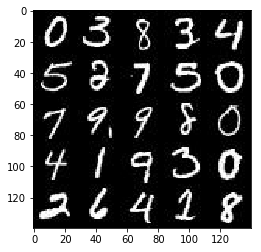

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

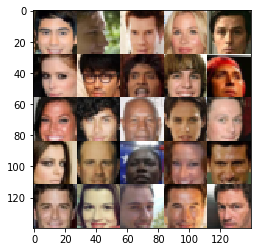

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [6]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [27]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32,(None, image_width, 
                                             image_height, image_channels),
                                 'input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    return input_real, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [28]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha=0.1
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        x1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=True)
        x2 = tf.maximum(alpha * x2, x2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=True)
        x3 = tf.maximum(alpha * x3, x3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [29]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        alpha=0.1
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7,7,512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha*x1, x1)
        # 7x7x512
        
        x2 = tf.layers.conv2d_transpose(x1,256, 5, strides=1, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2,x2)
        # 7x7x256
        
        x3 = tf.layers.conv2d_transpose(x2, 128,5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3,x3)
        # 14x14x256
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [43]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    smooth = 0.1
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                               labels=tf.ones_like(d_model_real)*(1 - smooth)))
    d_loss_fake = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                           labels=tf.zeros_like(d_model_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                            labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [31]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # getting weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    # optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [32]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [48]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    _, image_width, image_height, image_channels = data_shape
    
    real_input, z_input, lr = model_inputs(image_width, 
                                           image_height,
                                           image_channels, 
                                           z_dim)
    d_loss, g_loss = model_loss(real_input, z_input, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss,lr, beta1)
    
    losses = []
    steps = 0
    print_every = 10
    show_every = 100
    n_images = 25
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps+=1
                batch_images *= 2.0
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={real_input: batch_images, 
                                               z_input: batch_z,
                                              lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_input: batch_images, 
                                               z_input: batch_z, 
                                               lr: learning_rate})
                _ = sess.run(d_opt, feed_dict={real_input: batch_images, 
                                               z_input: batch_z,
                                              lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_input: batch_images, 
                                               z_input: batch_z, 
                                               lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={real_input: batch_images, 
                                               z_input: batch_z, 
                                               lr: learning_rate})
                if steps % print_every == 0:
                    # print losses at end of epoch
                    train_loss_d = d_loss.eval({z_input: batch_z, real_input: batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # save losses
                    losses.append((train_loss_d, train_loss_g))
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_input, image_channels, data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.8158... Generator Loss: 0.0839
Epoch 1/2... Discriminator Loss: 1.8554... Generator Loss: 1.5878
Epoch 1/2... Discriminator Loss: 0.6549... Generator Loss: 4.3702
Epoch 1/2... Discriminator Loss: 0.4172... Generator Loss: 1.5591
Epoch 1/2... Discriminator Loss: 1.4710... Generator Loss: 0.4603
Epoch 1/2... Discriminator Loss: 1.8257... Generator Loss: 2.2658
Epoch 1/2... Discriminator Loss: 0.8459... Generator Loss: 2.1363
Epoch 1/2... Discriminator Loss: 1.4610... Generator Loss: 3.2360
Epoch 1/2... Discriminator Loss: 1.1294... Generator Loss: 1.7782
Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.7209


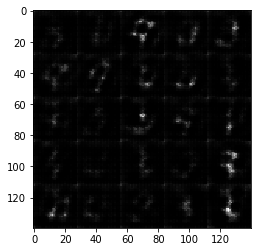

Epoch 1/2... Discriminator Loss: 1.3050... Generator Loss: 0.4379
Epoch 1/2... Discriminator Loss: 1.2998... Generator Loss: 1.1289
Epoch 1/2... Discriminator Loss: 1.5035... Generator Loss: 0.3720
Epoch 1/2... Discriminator Loss: 1.0531... Generator Loss: 1.3143
Epoch 1/2... Discriminator Loss: 1.2331... Generator Loss: 0.9448
Epoch 1/2... Discriminator Loss: 1.2473... Generator Loss: 0.8507
Epoch 1/2... Discriminator Loss: 1.8074... Generator Loss: 0.2987
Epoch 1/2... Discriminator Loss: 1.2272... Generator Loss: 1.1287
Epoch 1/2... Discriminator Loss: 1.5652... Generator Loss: 0.3923
Epoch 1/2... Discriminator Loss: 1.1719... Generator Loss: 0.9748


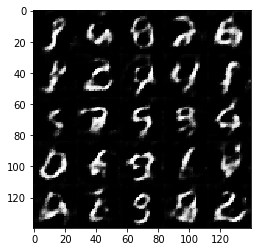

Epoch 1/2... Discriminator Loss: 1.9062... Generator Loss: 2.3326
Epoch 1/2... Discriminator Loss: 1.2785... Generator Loss: 0.5363
Epoch 1/2... Discriminator Loss: 0.9731... Generator Loss: 1.3402
Epoch 1/2... Discriminator Loss: 1.3184... Generator Loss: 1.4310
Epoch 1/2... Discriminator Loss: 1.1114... Generator Loss: 0.9030
Epoch 1/2... Discriminator Loss: 1.2162... Generator Loss: 0.7493
Epoch 1/2... Discriminator Loss: 1.0971... Generator Loss: 1.5214
Epoch 1/2... Discriminator Loss: 1.0528... Generator Loss: 1.1006
Epoch 1/2... Discriminator Loss: 1.0411... Generator Loss: 0.9029
Epoch 1/2... Discriminator Loss: 1.3314... Generator Loss: 0.4762


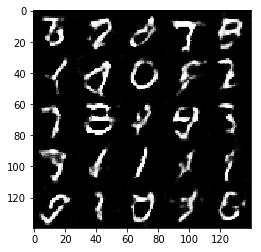

Epoch 1/2... Discriminator Loss: 1.2049... Generator Loss: 1.4625
Epoch 1/2... Discriminator Loss: 1.1953... Generator Loss: 1.2836
Epoch 1/2... Discriminator Loss: 1.7131... Generator Loss: 0.3019
Epoch 1/2... Discriminator Loss: 1.1298... Generator Loss: 0.9653
Epoch 1/2... Discriminator Loss: 1.1223... Generator Loss: 0.8260
Epoch 1/2... Discriminator Loss: 1.1444... Generator Loss: 1.7352
Epoch 1/2... Discriminator Loss: 1.2621... Generator Loss: 0.5004
Epoch 1/2... Discriminator Loss: 1.0588... Generator Loss: 1.0459
Epoch 1/2... Discriminator Loss: 1.0836... Generator Loss: 0.9883
Epoch 1/2... Discriminator Loss: 1.1915... Generator Loss: 0.5915


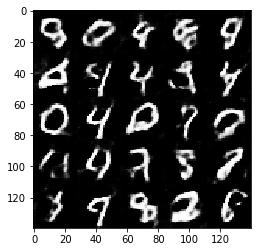

Epoch 1/2... Discriminator Loss: 1.1565... Generator Loss: 1.2611
Epoch 1/2... Discriminator Loss: 1.0479... Generator Loss: 0.9287
Epoch 1/2... Discriminator Loss: 1.0649... Generator Loss: 1.2618
Epoch 1/2... Discriminator Loss: 1.1001... Generator Loss: 1.0641
Epoch 1/2... Discriminator Loss: 1.1629... Generator Loss: 0.8181
Epoch 1/2... Discriminator Loss: 1.0888... Generator Loss: 0.9169
Epoch 2/2... Discriminator Loss: 1.0960... Generator Loss: 0.8783
Epoch 2/2... Discriminator Loss: 1.2139... Generator Loss: 1.4338
Epoch 2/2... Discriminator Loss: 1.0746... Generator Loss: 0.7245
Epoch 2/2... Discriminator Loss: 1.1249... Generator Loss: 1.0677


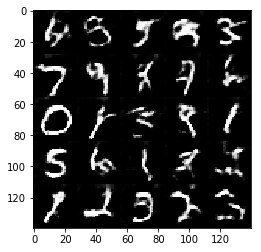

Epoch 2/2... Discriminator Loss: 1.3265... Generator Loss: 0.4535
Epoch 2/2... Discriminator Loss: 1.0362... Generator Loss: 1.3747
Epoch 2/2... Discriminator Loss: 1.1681... Generator Loss: 1.1975
Epoch 2/2... Discriminator Loss: 1.0843... Generator Loss: 0.7747
Epoch 2/2... Discriminator Loss: 1.0045... Generator Loss: 0.8286
Epoch 2/2... Discriminator Loss: 1.2931... Generator Loss: 1.9804
Epoch 2/2... Discriminator Loss: 2.0537... Generator Loss: 0.1774
Epoch 2/2... Discriminator Loss: 1.0019... Generator Loss: 0.7311
Epoch 2/2... Discriminator Loss: 1.1837... Generator Loss: 0.5511
Epoch 2/2... Discriminator Loss: 0.9293... Generator Loss: 1.6603


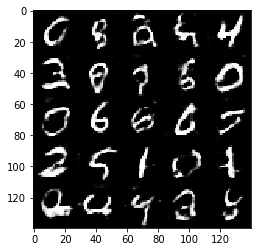

Epoch 2/2... Discriminator Loss: 1.1528... Generator Loss: 0.5785
Epoch 2/2... Discriminator Loss: 1.1768... Generator Loss: 0.5548
Epoch 2/2... Discriminator Loss: 1.2625... Generator Loss: 0.5414
Epoch 2/2... Discriminator Loss: 1.7812... Generator Loss: 0.2661
Epoch 2/2... Discriminator Loss: 0.9143... Generator Loss: 0.9097
Epoch 2/2... Discriminator Loss: 2.2490... Generator Loss: 0.1512
Epoch 2/2... Discriminator Loss: 1.3189... Generator Loss: 0.4830
Epoch 2/2... Discriminator Loss: 1.1090... Generator Loss: 1.3936
Epoch 2/2... Discriminator Loss: 1.0766... Generator Loss: 0.8705
Epoch 2/2... Discriminator Loss: 1.5929... Generator Loss: 0.3381


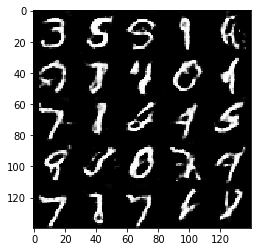

Epoch 2/2... Discriminator Loss: 1.0985... Generator Loss: 1.0963
Epoch 2/2... Discriminator Loss: 1.3736... Generator Loss: 0.4753
Epoch 2/2... Discriminator Loss: 0.9918... Generator Loss: 0.9994
Epoch 2/2... Discriminator Loss: 1.0935... Generator Loss: 0.9317
Epoch 2/2... Discriminator Loss: 1.1997... Generator Loss: 1.3893
Epoch 2/2... Discriminator Loss: 0.9636... Generator Loss: 1.3990
Epoch 2/2... Discriminator Loss: 1.1030... Generator Loss: 1.2877
Epoch 2/2... Discriminator Loss: 1.3786... Generator Loss: 0.4324
Epoch 2/2... Discriminator Loss: 1.4459... Generator Loss: 0.4164
Epoch 2/2... Discriminator Loss: 1.3083... Generator Loss: 0.4758


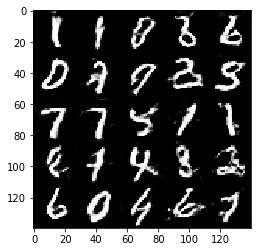

Epoch 2/2... Discriminator Loss: 1.2425... Generator Loss: 0.5707
Epoch 2/2... Discriminator Loss: 1.2377... Generator Loss: 0.6890
Epoch 2/2... Discriminator Loss: 1.0488... Generator Loss: 0.8668
Epoch 2/2... Discriminator Loss: 1.4092... Generator Loss: 0.3787
Epoch 2/2... Discriminator Loss: 1.0861... Generator Loss: 1.7379
Epoch 2/2... Discriminator Loss: 1.1529... Generator Loss: 1.0005
Epoch 2/2... Discriminator Loss: 1.1288... Generator Loss: 1.2398
Epoch 2/2... Discriminator Loss: 1.1506... Generator Loss: 1.5168
Epoch 2/2... Discriminator Loss: 0.9654... Generator Loss: 0.8633
Epoch 2/2... Discriminator Loss: 1.4006... Generator Loss: 0.4897


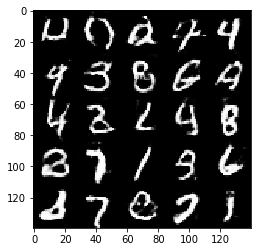

Epoch 2/2... Discriminator Loss: 1.1633... Generator Loss: 0.6461
Epoch 2/2... Discriminator Loss: 1.3176... Generator Loss: 0.4982
Epoch 2/2... Discriminator Loss: 1.3146... Generator Loss: 0.5015


In [40]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.4333... Generator Loss: 0.1434
Epoch 1/1... Discriminator Loss: 2.3705... Generator Loss: 0.3588
Epoch 1/1... Discriminator Loss: 1.6575... Generator Loss: 0.4862
Epoch 1/1... Discriminator Loss: 1.9695... Generator Loss: 0.3664
Epoch 1/1... Discriminator Loss: 1.9301... Generator Loss: 0.4273
Epoch 1/1... Discriminator Loss: 1.6461... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 1.5660... Generator Loss: 0.8442
Epoch 1/1... Discriminator Loss: 1.3899... Generator Loss: 0.6178
Epoch 1/1... Discriminator Loss: 1.8593... Generator Loss: 0.4574
Epoch 1/1... Discriminator Loss: 1.8470... Generator Loss: 0.7726


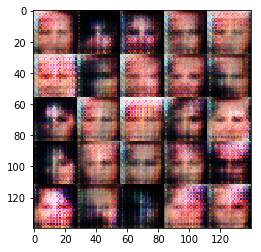

Epoch 1/1... Discriminator Loss: 1.7156... Generator Loss: 0.5385
Epoch 1/1... Discriminator Loss: 1.6498... Generator Loss: 0.6207
Epoch 1/1... Discriminator Loss: 1.6836... Generator Loss: 0.5424
Epoch 1/1... Discriminator Loss: 1.6430... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.5051... Generator Loss: 0.6526
Epoch 1/1... Discriminator Loss: 1.5584... Generator Loss: 0.7830
Epoch 1/1... Discriminator Loss: 1.4816... Generator Loss: 0.6584
Epoch 1/1... Discriminator Loss: 1.9839... Generator Loss: 0.5225
Epoch 1/1... Discriminator Loss: 1.4612... Generator Loss: 0.7034
Epoch 1/1... Discriminator Loss: 1.7029... Generator Loss: 0.4301


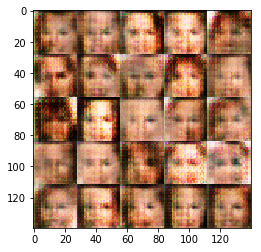

Epoch 1/1... Discriminator Loss: 1.6164... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.7507... Generator Loss: 0.4397
Epoch 1/1... Discriminator Loss: 1.7145... Generator Loss: 0.6385
Epoch 1/1... Discriminator Loss: 1.6699... Generator Loss: 0.6305
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.7997... Generator Loss: 0.5179
Epoch 1/1... Discriminator Loss: 1.7268... Generator Loss: 0.4894
Epoch 1/1... Discriminator Loss: 1.5407... Generator Loss: 0.6588
Epoch 1/1... Discriminator Loss: 1.5463... Generator Loss: 0.6196
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.6930


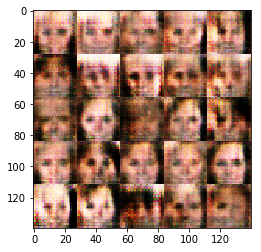

Epoch 1/1... Discriminator Loss: 1.7138... Generator Loss: 0.5229
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.6569... Generator Loss: 0.8729
Epoch 1/1... Discriminator Loss: 1.6603... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 1.6912... Generator Loss: 0.9421
Epoch 1/1... Discriminator Loss: 1.6001... Generator Loss: 0.5756
Epoch 1/1... Discriminator Loss: 1.6469... Generator Loss: 0.6249
Epoch 1/1... Discriminator Loss: 1.5173... Generator Loss: 0.6925
Epoch 1/1... Discriminator Loss: 1.4690... Generator Loss: 0.7547
Epoch 1/1... Discriminator Loss: 1.4679... Generator Loss: 0.6810


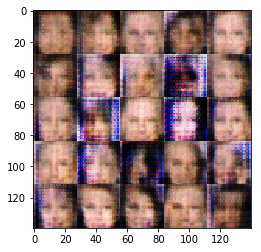

Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.6731
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.6802
Epoch 1/1... Discriminator Loss: 1.6016... Generator Loss: 0.6211
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.5728
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.8718
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.5012... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.5293... Generator Loss: 0.6668


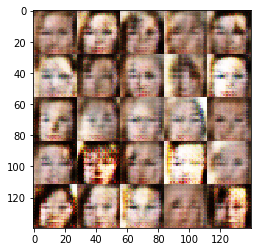

Epoch 1/1... Discriminator Loss: 1.7368... Generator Loss: 0.5861
Epoch 1/1... Discriminator Loss: 1.6113... Generator Loss: 0.4926
Epoch 1/1... Discriminator Loss: 1.4978... Generator Loss: 0.6590
Epoch 1/1... Discriminator Loss: 1.5644... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.4892... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.5222... Generator Loss: 0.6700
Epoch 1/1... Discriminator Loss: 1.6801... Generator Loss: 0.6344
Epoch 1/1... Discriminator Loss: 1.5125... Generator Loss: 0.6883
Epoch 1/1... Discriminator Loss: 1.7641... Generator Loss: 0.4826
Epoch 1/1... Discriminator Loss: 1.6044... Generator Loss: 0.6582


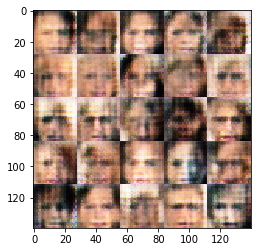

Epoch 1/1... Discriminator Loss: 1.4843... Generator Loss: 0.6265
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.4981... Generator Loss: 0.6370
Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.6563
Epoch 1/1... Discriminator Loss: 1.3840... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.5290... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.4848... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.4976... Generator Loss: 0.7552
Epoch 1/1... Discriminator Loss: 1.6068... Generator Loss: 0.5305
Epoch 1/1... Discriminator Loss: 1.6871... Generator Loss: 0.5706


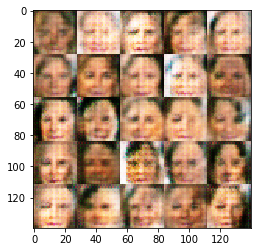

Epoch 1/1... Discriminator Loss: 1.4923... Generator Loss: 0.6085
Epoch 1/1... Discriminator Loss: 1.5440... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.4840... Generator Loss: 0.5890
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.5485... Generator Loss: 0.6139
Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.8406
Epoch 1/1... Discriminator Loss: 1.5442... Generator Loss: 0.7103
Epoch 1/1... Discriminator Loss: 1.5842... Generator Loss: 0.6283
Epoch 1/1... Discriminator Loss: 1.5671... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.5130... Generator Loss: 0.6521


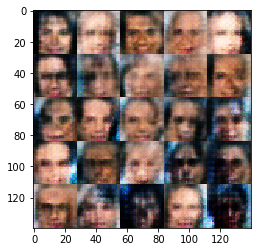

Epoch 1/1... Discriminator Loss: 1.4856... Generator Loss: 0.6357
Epoch 1/1... Discriminator Loss: 1.5392... Generator Loss: 0.5983
Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 0.6523
Epoch 1/1... Discriminator Loss: 1.5589... Generator Loss: 0.6330
Epoch 1/1... Discriminator Loss: 1.4889... Generator Loss: 0.6488
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.4960... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.4783... Generator Loss: 0.6586
Epoch 1/1... Discriminator Loss: 1.4925... Generator Loss: 0.7368


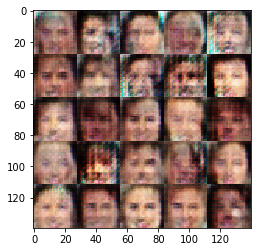

Epoch 1/1... Discriminator Loss: 1.6065... Generator Loss: 0.6643
Epoch 1/1... Discriminator Loss: 1.5934... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.5100... Generator Loss: 0.6463
Epoch 1/1... Discriminator Loss: 1.4855... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.7202
Epoch 1/1... Discriminator Loss: 1.6225... Generator Loss: 0.6677
Epoch 1/1... Discriminator Loss: 1.5826... Generator Loss: 0.7962
Epoch 1/1... Discriminator Loss: 1.3887... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.3519... Generator Loss: 0.7245
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.7076


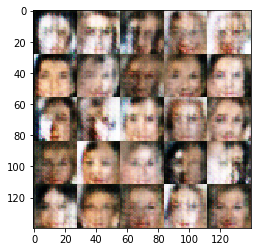

Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.7183
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.5441... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.4465... Generator Loss: 0.7182
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.7095
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.4673... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.6291
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.4715... Generator Loss: 0.6661


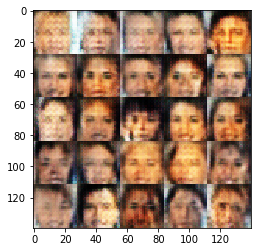

Epoch 1/1... Discriminator Loss: 1.4733... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.5086... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.7876
Epoch 1/1... Discriminator Loss: 1.4679... Generator Loss: 0.6652
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.6500
Epoch 1/1... Discriminator Loss: 1.4905... Generator Loss: 0.6681
Epoch 1/1... Discriminator Loss: 1.4752... Generator Loss: 0.6646
Epoch 1/1... Discriminator Loss: 1.5238... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 1.5617... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 1.5275... Generator Loss: 0.7929


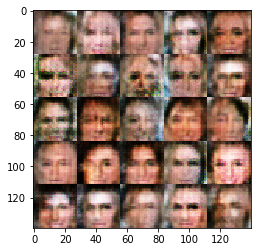

Epoch 1/1... Discriminator Loss: 1.4547... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 1.5826... Generator Loss: 0.6270
Epoch 1/1... Discriminator Loss: 1.5237... Generator Loss: 0.5973
Epoch 1/1... Discriminator Loss: 1.5127... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.4320... Generator Loss: 0.7717
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.5995


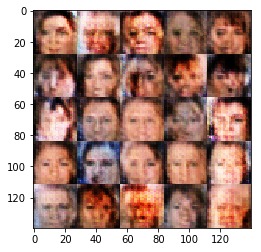

Epoch 1/1... Discriminator Loss: 1.5047... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.7342
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.7505
Epoch 1/1... Discriminator Loss: 1.4651... Generator Loss: 0.7457
Epoch 1/1... Discriminator Loss: 1.4910... Generator Loss: 0.6423
Epoch 1/1... Discriminator Loss: 1.4932... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.5427... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 1.4712... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.5109... Generator Loss: 0.6697


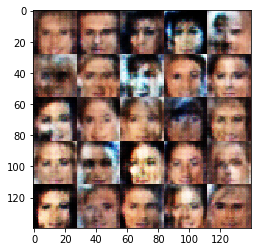

Epoch 1/1... Discriminator Loss: 1.4540... Generator Loss: 0.6501
Epoch 1/1... Discriminator Loss: 1.5102... Generator Loss: 0.6678
Epoch 1/1... Discriminator Loss: 1.4552... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.7694
Epoch 1/1... Discriminator Loss: 1.5639... Generator Loss: 0.6080
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.4756... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.5046... Generator Loss: 0.6587
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.6565


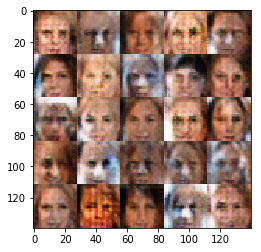

Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.4618... Generator Loss: 0.7231
Epoch 1/1... Discriminator Loss: 1.4245... Generator Loss: 0.7372
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.7276
Epoch 1/1... Discriminator Loss: 1.6220... Generator Loss: 0.5887
Epoch 1/1... Discriminator Loss: 1.4492... Generator Loss: 0.7168
Epoch 1/1... Discriminator Loss: 1.4869... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.5288... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.3576... Generator Loss: 0.7781


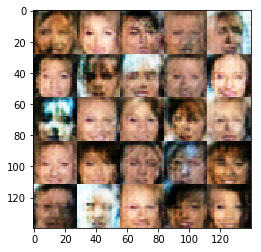

Epoch 1/1... Discriminator Loss: 1.5366... Generator Loss: 0.7767
Epoch 1/1... Discriminator Loss: 1.5098... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.5584... Generator Loss: 0.6566
Epoch 1/1... Discriminator Loss: 1.4794... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.5078... Generator Loss: 0.6877
Epoch 1/1... Discriminator Loss: 1.4839... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.4582... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.4908... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.3877... Generator Loss: 0.7714


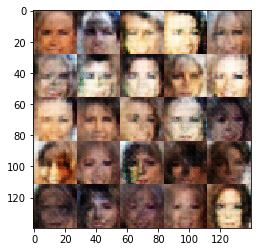

Epoch 1/1... Discriminator Loss: 1.4801... Generator Loss: 0.7161
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.4994... Generator Loss: 0.6747
Epoch 1/1... Discriminator Loss: 1.4583... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.7471
Epoch 1/1... Discriminator Loss: 1.5199... Generator Loss: 0.6642
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.7589
Epoch 1/1... Discriminator Loss: 1.5310... Generator Loss: 0.6877
Epoch 1/1... Discriminator Loss: 1.4846... Generator Loss: 0.7349


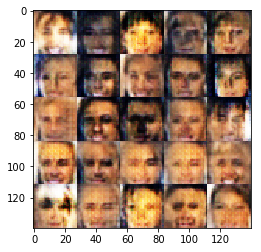

Epoch 1/1... Discriminator Loss: 1.4971... Generator Loss: 0.7092
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.4827... Generator Loss: 0.7175
Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.5577... Generator Loss: 0.6350
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.6804
Epoch 1/1... Discriminator Loss: 1.5218... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.7222
Epoch 1/1... Discriminator Loss: 1.5019... Generator Loss: 0.6773


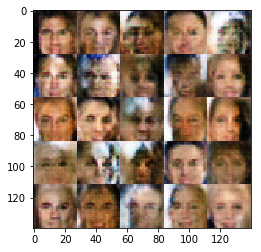

Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.4803... Generator Loss: 0.6581
Epoch 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.6658
Epoch 1/1... Discriminator Loss: 1.5620... Generator Loss: 0.6434
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.6895
Epoch 1/1... Discriminator Loss: 1.4332... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4182... Generator Loss: 0.8233
Epoch 1/1... Discriminator Loss: 1.4833... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.6903
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.6778


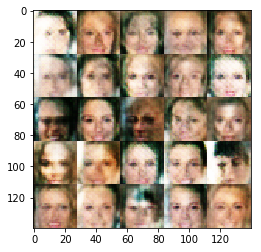

Epoch 1/1... Discriminator Loss: 1.4824... Generator Loss: 0.7144
Epoch 1/1... Discriminator Loss: 1.5457... Generator Loss: 0.6503
Epoch 1/1... Discriminator Loss: 1.4004... Generator Loss: 0.7912
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.5005... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.6565
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.4564... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4598... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.4341... Generator Loss: 0.6997


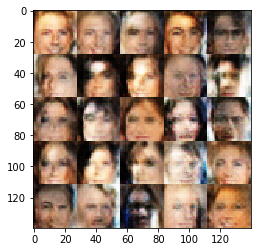

Epoch 1/1... Discriminator Loss: 1.4611... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 1.4913... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.4807... Generator Loss: 0.6857
Epoch 1/1... Discriminator Loss: 1.4951... Generator Loss: 0.6411
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.4217... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 1.4735... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.4649... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.4509... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.6987


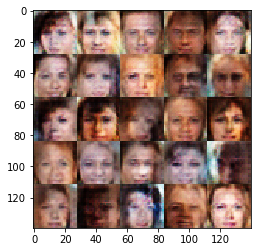

Epoch 1/1... Discriminator Loss: 1.4953... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.7287
Epoch 1/1... Discriminator Loss: 1.4837... Generator Loss: 0.6649
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.6922
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.7803
Epoch 1/1... Discriminator Loss: 1.4463... Generator Loss: 0.7437
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.4514... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 1.4487... Generator Loss: 0.7473
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.7227


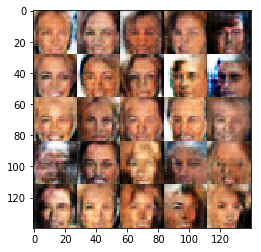

Epoch 1/1... Discriminator Loss: 1.4533... Generator Loss: 0.7102
Epoch 1/1... Discriminator Loss: 1.4680... Generator Loss: 0.6672
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.7212
Epoch 1/1... Discriminator Loss: 1.4072... Generator Loss: 0.7590
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.7053
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.4717... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.4415... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.7199


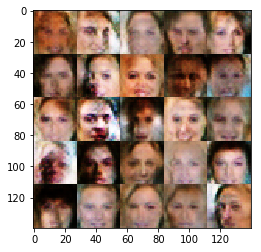

Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.7099
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.7224
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.4392... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.7696
Epoch 1/1... Discriminator Loss: 1.4623... Generator Loss: 0.7066
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.7274
Epoch 1/1... Discriminator Loss: 1.4821... Generator Loss: 0.6915


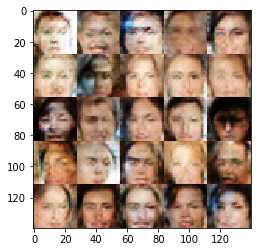

Epoch 1/1... Discriminator Loss: 1.4745... Generator Loss: 0.6785
Epoch 1/1... Discriminator Loss: 1.4749... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.5020... Generator Loss: 0.7061
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.5298... Generator Loss: 0.7655
Epoch 1/1... Discriminator Loss: 1.4464... Generator Loss: 0.7388
Epoch 1/1... Discriminator Loss: 1.4794... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.4321... Generator Loss: 0.7236


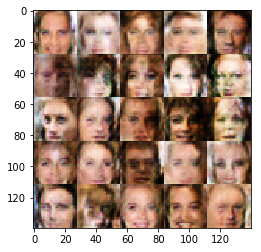

Epoch 1/1... Discriminator Loss: 1.4293... Generator Loss: 0.7080
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7167
Epoch 1/1... Discriminator Loss: 1.4605... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.4666... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.4668... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.4420... Generator Loss: 0.7219
Epoch 1/1... Discriminator Loss: 1.4622... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.4705... Generator Loss: 0.7006
Epoch 1/1... Discriminator Loss: 1.4664... Generator Loss: 0.6558


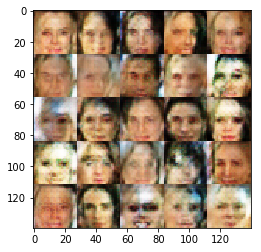

Epoch 1/1... Discriminator Loss: 1.5422... Generator Loss: 0.6470
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.3898... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.7303
Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.7228
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.4360... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.4666... Generator Loss: 0.7275
Epoch 1/1... Discriminator Loss: 1.4894... Generator Loss: 0.6791


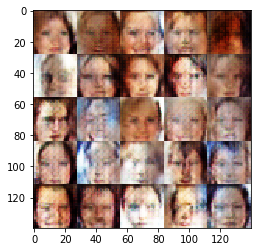

Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.7150
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.4377... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.4290... Generator Loss: 0.7180
Epoch 1/1... Discriminator Loss: 1.4789... Generator Loss: 0.7217
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.4479... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.4175... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.4295... Generator Loss: 0.7333


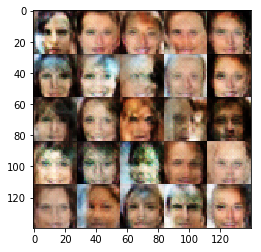

Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.7009
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.4375... Generator Loss: 0.7122
Epoch 1/1... Discriminator Loss: 1.4750... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 1.4505... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.4337... Generator Loss: 0.7190
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.4383... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.7388


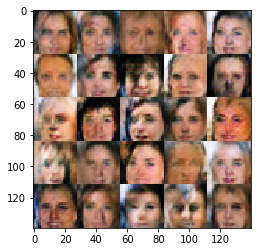

Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7306
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.6891
Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.7537
Epoch 1/1... Discriminator Loss: 1.4732... Generator Loss: 0.6683
Epoch 1/1... Discriminator Loss: 1.4593... Generator Loss: 0.7093
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7486
Epoch 1/1... Discriminator Loss: 1.4545... Generator Loss: 0.6585
Epoch 1/1... Discriminator Loss: 1.4521... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.4399... Generator Loss: 0.7004


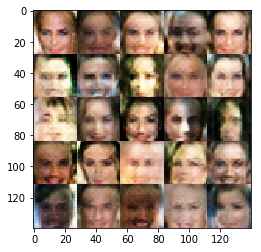

Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.7144
Epoch 1/1... Discriminator Loss: 1.4412... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.7520
Epoch 1/1... Discriminator Loss: 1.4608... Generator Loss: 0.7023
Epoch 1/1... Discriminator Loss: 1.4798... Generator Loss: 0.6860
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7366
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.7191
Epoch 1/1... Discriminator Loss: 1.4632... Generator Loss: 0.7327
Epoch 1/1... Discriminator Loss: 1.5211... Generator Loss: 0.6774


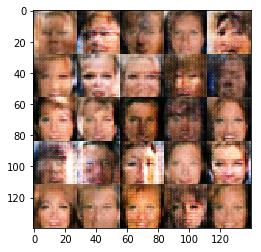

Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.7580
Epoch 1/1... Discriminator Loss: 1.4682... Generator Loss: 0.7023
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.4702... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.4780... Generator Loss: 0.6707
Epoch 1/1... Discriminator Loss: 1.4833... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.7232
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.7397
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.7040


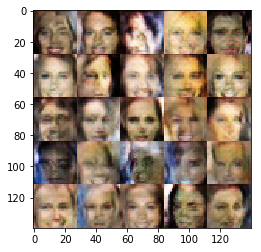

Epoch 1/1... Discriminator Loss: 1.4193... Generator Loss: 0.7240
Epoch 1/1... Discriminator Loss: 1.4684... Generator Loss: 0.7078
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.7166
Epoch 1/1... Discriminator Loss: 1.5075... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.4325... Generator Loss: 0.7200
Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.4644... Generator Loss: 0.7019
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.6841


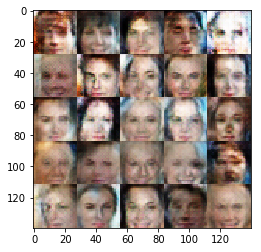

Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.4379... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4613... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 1.4500... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.6657
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.7396
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7290


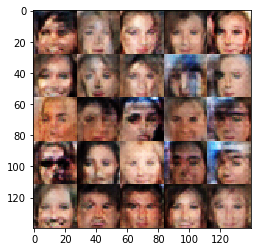

Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.7243
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.4484... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.4965... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.7132


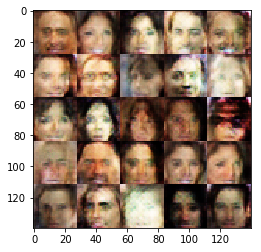

Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.6993
Epoch 1/1... Discriminator Loss: 1.4249... Generator Loss: 0.7298
Epoch 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 1.4133... Generator Loss: 0.7023
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.7099
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.4663... Generator Loss: 0.6723
Epoch 1/1... Discriminator Loss: 1.4276... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.7753
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.6636


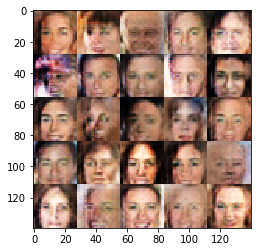

Epoch 1/1... Discriminator Loss: 1.4274... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.6908
Epoch 1/1... Discriminator Loss: 1.4306... Generator Loss: 0.7315
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.7373
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.7587
Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.7472
Epoch 1/1... Discriminator Loss: 1.4286... Generator Loss: 0.7046
Epoch 1/1... Discriminator Loss: 1.4574... Generator Loss: 0.7180
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.7643
Epoch 1/1... Discriminator Loss: 1.4445... Generator Loss: 0.7033


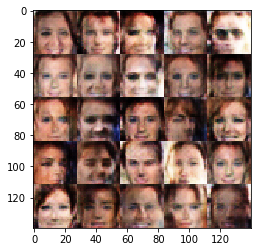

Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.7381
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.4325... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.4296... Generator Loss: 0.7612
Epoch 1/1... Discriminator Loss: 1.4026... Generator Loss: 0.7596
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7131
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.7631
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.4038... Generator Loss: 0.7649
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.7114


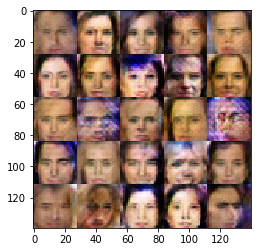

Epoch 1/1... Discriminator Loss: 1.4331... Generator Loss: 0.8525
Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.7660
Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.7487
Epoch 1/1... Discriminator Loss: 1.4358... Generator Loss: 0.7171
Epoch 1/1... Discriminator Loss: 1.4729... Generator Loss: 0.6797
Epoch 1/1... Discriminator Loss: 1.4412... Generator Loss: 0.6815
Epoch 1/1... Discriminator Loss: 1.4177... Generator Loss: 0.7144
Epoch 1/1... Discriminator Loss: 1.4471... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.4255... Generator Loss: 0.7450


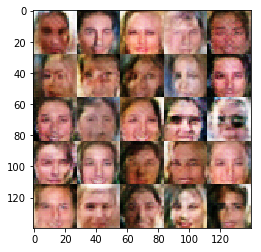

Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.3971... Generator Loss: 0.7479
Epoch 1/1... Discriminator Loss: 1.4228... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 0.7642
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.7437


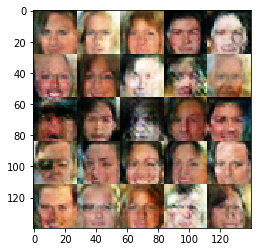

Epoch 1/1... Discriminator Loss: 1.4134... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.4975... Generator Loss: 0.6582
Epoch 1/1... Discriminator Loss: 1.4628... Generator Loss: 0.7323
Epoch 1/1... Discriminator Loss: 1.4478... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.6783
Epoch 1/1... Discriminator Loss: 1.4331... Generator Loss: 0.7025
Epoch 1/1... Discriminator Loss: 1.4413... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.7321
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7203
Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.7157


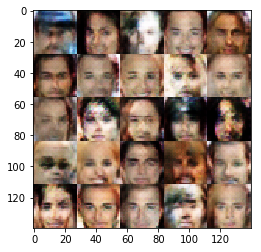

Epoch 1/1... Discriminator Loss: 1.4451... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.4748... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.4234... Generator Loss: 0.7134
Epoch 1/1... Discriminator Loss: 1.4362... Generator Loss: 0.7471
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.7402
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.4242... Generator Loss: 0.6936
Epoch 1/1... Discriminator Loss: 1.4392... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.4270... Generator Loss: 0.7079


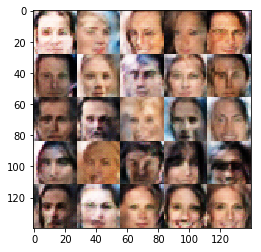

Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.7279
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.7107
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.4098... Generator Loss: 0.7224
Epoch 1/1... Discriminator Loss: 1.4658... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.7751
Epoch 1/1... Discriminator Loss: 1.4814... Generator Loss: 0.6831


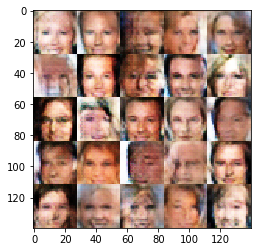

Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.3860... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.7092
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.7825
Epoch 1/1... Discriminator Loss: 1.4135... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.7324
Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.7416
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.7366


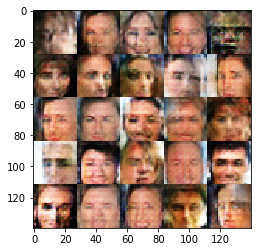

Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7489
Epoch 1/1... Discriminator Loss: 1.4751... Generator Loss: 0.7235
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.7115
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.7368
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.7350
Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 0.7610
Epoch 1/1... Discriminator Loss: 1.4111... Generator Loss: 0.7152
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.7663
Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.7245


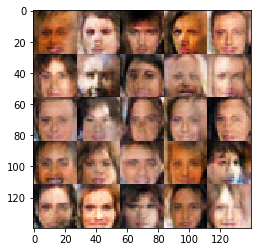

Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.4329... Generator Loss: 0.7027
Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.7356
Epoch 1/1... Discriminator Loss: 1.3998... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.4143... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 1.4406... Generator Loss: 0.7094
Epoch 1/1... Discriminator Loss: 1.4009... Generator Loss: 0.7693
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.6678
Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.6952


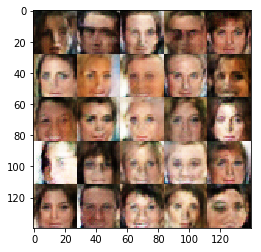

Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.7389
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.4257... Generator Loss: 0.7541
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7417
Epoch 1/1... Discriminator Loss: 1.4214... Generator Loss: 0.7156
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.7468


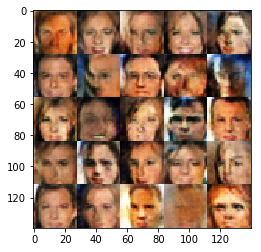

Epoch 1/1... Discriminator Loss: 1.4322... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.7512
Epoch 1/1... Discriminator Loss: 1.4493... Generator Loss: 0.7146
Epoch 1/1... Discriminator Loss: 1.3939... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.4213... Generator Loss: 0.7532
Epoch 1/1... Discriminator Loss: 1.4213... Generator Loss: 0.7548
Epoch 1/1... Discriminator Loss: 1.4342... Generator Loss: 0.7362
Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.7241
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.7447
Epoch 1/1... Discriminator Loss: 1.3943... Generator Loss: 0.7447


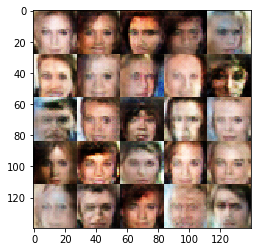

Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.7125
Epoch 1/1... Discriminator Loss: 1.4179... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.4214... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.4271... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.4663... Generator Loss: 0.6909
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.7399
Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.7338
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.7423
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.7277


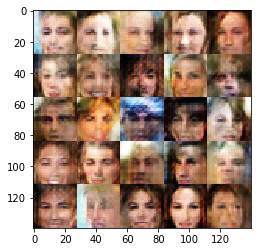

Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.7464
Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.4076... Generator Loss: 0.7411
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.4292... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.7492
Epoch 1/1... Discriminator Loss: 1.4017... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.3993... Generator Loss: 0.7465
Epoch 1/1... Discriminator Loss: 1.4136... Generator Loss: 0.7233


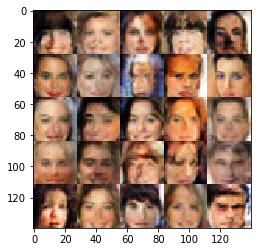

Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.4156... Generator Loss: 0.7575
Epoch 1/1... Discriminator Loss: 1.4011... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.7330
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7614
Epoch 1/1... Discriminator Loss: 1.4099... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.4034... Generator Loss: 0.7561
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.7193
Epoch 1/1... Discriminator Loss: 1.4275... Generator Loss: 0.7263


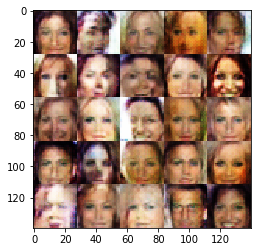

Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7586
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.7524
Epoch 1/1... Discriminator Loss: 1.4059... Generator Loss: 0.7604
Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.4120... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.7832
Epoch 1/1... Discriminator Loss: 1.4657... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.7332


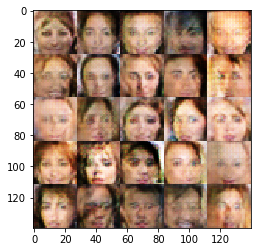

Epoch 1/1... Discriminator Loss: 1.4163... Generator Loss: 0.7443
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.4433... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4261... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.4305... Generator Loss: 0.7354
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.7641
Epoch 1/1... Discriminator Loss: 1.4141... Generator Loss: 0.7426


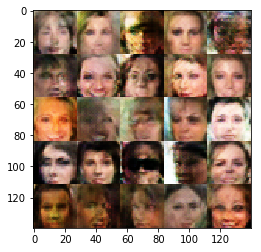

Epoch 1/1... Discriminator Loss: 1.4371... Generator Loss: 0.7424
Epoch 1/1... Discriminator Loss: 1.4122... Generator Loss: 0.7382
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 0.7186
Epoch 1/1... Discriminator Loss: 1.4478... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.7412
Epoch 1/1... Discriminator Loss: 1.4087... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.4212... Generator Loss: 0.7337
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.7621
Epoch 1/1... Discriminator Loss: 1.3995... Generator Loss: 0.7556
Epoch 1/1... Discriminator Loss: 1.4113... Generator Loss: 0.7608


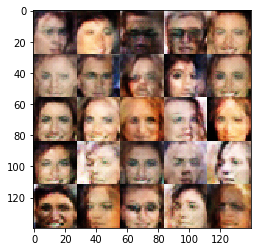

Epoch 1/1... Discriminator Loss: 1.4260... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.4226... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.4199... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.4045... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.7251
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.7029
Epoch 1/1... Discriminator Loss: 1.3970... Generator Loss: 0.7600
Epoch 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.7467
Epoch 1/1... Discriminator Loss: 1.4165... Generator Loss: 0.7345
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.7358


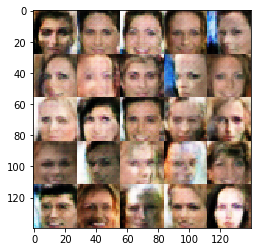

Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.7408
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 0.7031
Epoch 1/1... Discriminator Loss: 1.4189... Generator Loss: 0.7405
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.4365... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.4207... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.4100... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.4092... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.7795
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7675


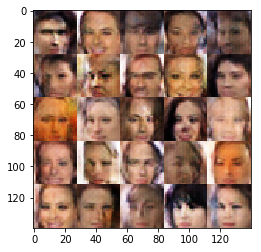

Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.7687
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.7549
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.7745
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.7297
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.7299
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7529
Epoch 1/1... Discriminator Loss: 1.4449... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.4436... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.7233


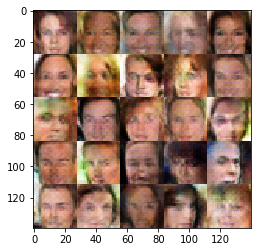

Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.7668
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.7304
Epoch 1/1... Discriminator Loss: 1.4158... Generator Loss: 0.7468
Epoch 1/1... Discriminator Loss: 1.4297... Generator Loss: 0.7385
Epoch 1/1... Discriminator Loss: 1.4238... Generator Loss: 0.7419
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.7392
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.7100
Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.7904
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.7800
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.7242


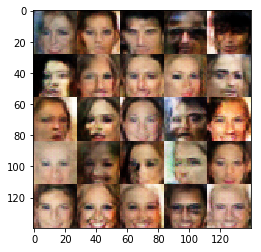

Epoch 1/1... Discriminator Loss: 1.4365... Generator Loss: 0.7062
Epoch 1/1... Discriminator Loss: 1.3985... Generator Loss: 0.7442
Epoch 1/1... Discriminator Loss: 1.4427... Generator Loss: 0.7371
Epoch 1/1... Discriminator Loss: 1.4310... Generator Loss: 0.7335
Epoch 1/1... Discriminator Loss: 1.4476... Generator Loss: 0.7113
Epoch 1/1... Discriminator Loss: 1.4205... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.7375
Epoch 1/1... Discriminator Loss: 1.3940... Generator Loss: 0.7563
Epoch 1/1... Discriminator Loss: 1.4189... Generator Loss: 0.7277
Epoch 1/1... Discriminator Loss: 1.4343... Generator Loss: 0.7268


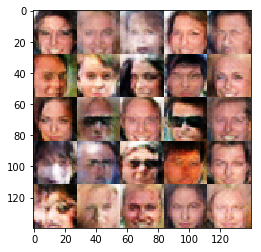

Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.7307
Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.7609
Epoch 1/1... Discriminator Loss: 1.4172... Generator Loss: 0.7496
Epoch 1/1... Discriminator Loss: 1.3937... Generator Loss: 0.7719
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.4317... Generator Loss: 0.6947
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7089
Epoch 1/1... Discriminator Loss: 1.3815... Generator Loss: 0.7500


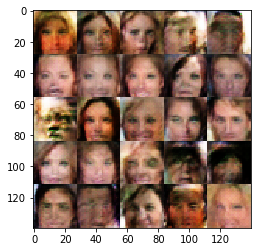

Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.7084
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.4074... Generator Loss: 0.7159
Epoch 1/1... Discriminator Loss: 1.4149... Generator Loss: 0.7217
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.7429
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4457... Generator Loss: 0.7268
Epoch 1/1... Discriminator Loss: 1.4361... Generator Loss: 0.7178
Epoch 1/1... Discriminator Loss: 1.4027... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.7315


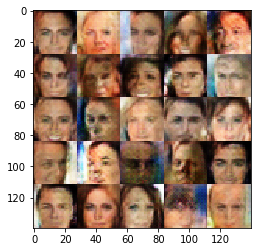

Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.7493
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 0.7192
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.7264
Epoch 1/1... Discriminator Loss: 1.4078... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 1.4159... Generator Loss: 0.7446
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7313
Epoch 1/1... Discriminator Loss: 1.4056... Generator Loss: 0.7475
Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 0.7440
Epoch 1/1... Discriminator Loss: 1.4224... Generator Loss: 0.7335


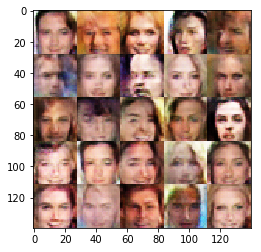

Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.7351
Epoch 1/1... Discriminator Loss: 1.4263... Generator Loss: 0.7346
Epoch 1/1... Discriminator Loss: 1.4258... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.3922... Generator Loss: 0.7617
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.7648
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.7500


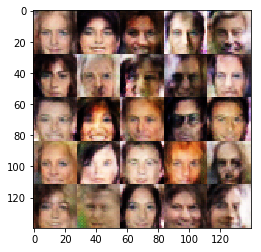

Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.7251
Epoch 1/1... Discriminator Loss: 1.3983... Generator Loss: 0.7538
Epoch 1/1... Discriminator Loss: 1.4457... Generator Loss: 0.7128
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.7018
Epoch 1/1... Discriminator Loss: 1.3911... Generator Loss: 0.7657
Epoch 1/1... Discriminator Loss: 1.4268... Generator Loss: 0.7517
Epoch 1/1... Discriminator Loss: 1.4309... Generator Loss: 0.7384
Epoch 1/1... Discriminator Loss: 1.4116... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.7441


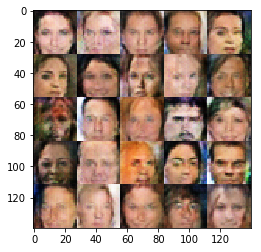

Epoch 1/1... Discriminator Loss: 1.4241... Generator Loss: 0.7356
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7606
Epoch 1/1... Discriminator Loss: 1.4035... Generator Loss: 0.7416
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.7482
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7310
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.7745
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.7210
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.7441
Epoch 1/1... Discriminator Loss: 1.3920... Generator Loss: 0.7496


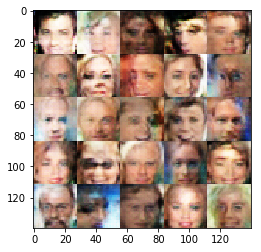

Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.7082
Epoch 1/1... Discriminator Loss: 1.4069... Generator Loss: 0.7208
Epoch 1/1... Discriminator Loss: 1.4070... Generator Loss: 0.7455
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 0.7252
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.7205
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.7362
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7034
Epoch 1/1... Discriminator Loss: 1.4053... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.7062


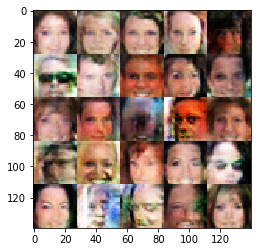

Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.7314
Epoch 1/1... Discriminator Loss: 1.4413... Generator Loss: 0.7184
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.7030
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.7355
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.7100
Epoch 1/1... Discriminator Loss: 1.4066... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.7791
Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.7409
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.7347


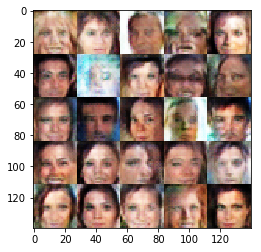

Epoch 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.7513
Epoch 1/1... Discriminator Loss: 1.4171... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.4174... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.4401... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.7426
Epoch 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.7525
Epoch 1/1... Discriminator Loss: 1.4166... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.4189... Generator Loss: 0.7326
Epoch 1/1... Discriminator Loss: 1.4075... Generator Loss: 0.7393


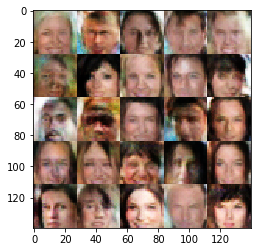

Epoch 1/1... Discriminator Loss: 1.4031... Generator Loss: 0.7283
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.6856
Epoch 1/1... Discriminator Loss: 1.4377... Generator Loss: 0.6821
Epoch 1/1... Discriminator Loss: 1.4527... Generator Loss: 0.6998
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.7349
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 1.4238... Generator Loss: 0.7096
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.7077


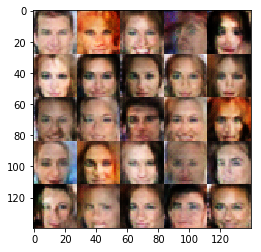

Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.4050... Generator Loss: 0.7554
Epoch 1/1... Discriminator Loss: 1.4143... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.7430
Epoch 1/1... Discriminator Loss: 1.4142... Generator Loss: 0.7592
Epoch 1/1... Discriminator Loss: 1.4365... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.7072


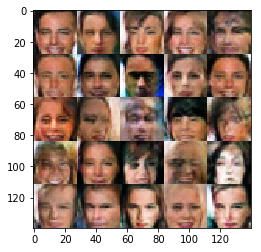

Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.7190
Epoch 1/1... Discriminator Loss: 1.4487... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.7613
Epoch 1/1... Discriminator Loss: 1.4277... Generator Loss: 0.7325
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.4143... Generator Loss: 0.7063
Epoch 1/1... Discriminator Loss: 1.4602... Generator Loss: 0.6707
Epoch 1/1... Discriminator Loss: 1.4300... Generator Loss: 0.7224


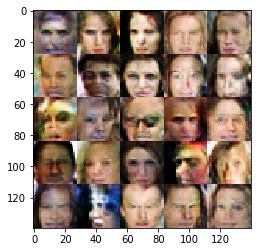

Epoch 1/1... Discriminator Loss: 1.4103... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.4205... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.4328... Generator Loss: 0.7251
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.4644... Generator Loss: 0.6878
Epoch 1/1... Discriminator Loss: 1.4272... Generator Loss: 0.7013
Epoch 1/1... Discriminator Loss: 1.4095... Generator Loss: 0.7711
Epoch 1/1... Discriminator Loss: 1.4032... Generator Loss: 0.7294
Epoch 1/1... Discriminator Loss: 1.3866... Generator Loss: 0.7692
Epoch 1/1... Discriminator Loss: 1.4645... Generator Loss: 0.6844


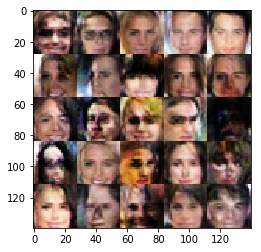

Epoch 1/1... Discriminator Loss: 1.4209... Generator Loss: 0.7361
Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.7439
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.4387... Generator Loss: 0.6935
Epoch 1/1... Discriminator Loss: 1.4180... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.7438
Epoch 1/1... Discriminator Loss: 1.4090... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.7216
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7233


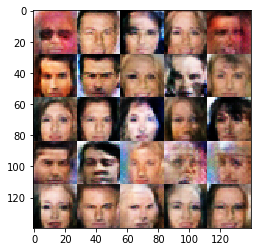

Epoch 1/1... Discriminator Loss: 1.4229... Generator Loss: 0.7057
Epoch 1/1... Discriminator Loss: 1.4391... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.7448
Epoch 1/1... Discriminator Loss: 1.4612... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.4370... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.4395... Generator Loss: 0.7333
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.7092
Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.7353
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.7033


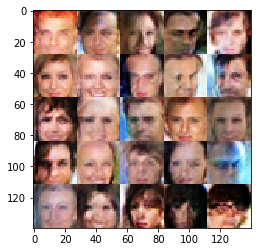

Epoch 1/1... Discriminator Loss: 1.4348... Generator Loss: 0.7022
Epoch 1/1... Discriminator Loss: 1.4562... Generator Loss: 0.6940
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.7257
Epoch 1/1... Discriminator Loss: 1.3820... Generator Loss: 0.7647
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.7237
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.7214
Epoch 1/1... Discriminator Loss: 1.4107... Generator Loss: 0.7415
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.7352
Epoch 1/1... Discriminator Loss: 1.3992... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.7227


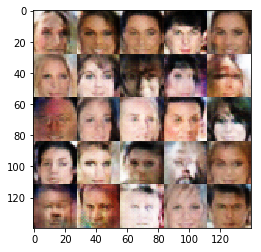

Epoch 1/1... Discriminator Loss: 1.4697... Generator Loss: 0.6739
Epoch 1/1... Discriminator Loss: 1.4191... Generator Loss: 0.7170
Epoch 1/1... Discriminator Loss: 1.4192... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7300
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.4082... Generator Loss: 0.7226
Epoch 1/1... Discriminator Loss: 1.3990... Generator Loss: 0.7215
Epoch 1/1... Discriminator Loss: 1.4433... Generator Loss: 0.7083
Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.7151


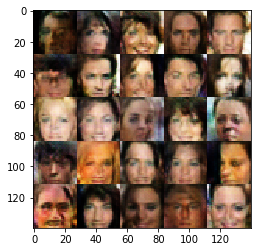

Epoch 1/1... Discriminator Loss: 1.4718... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.4186... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.7279
Epoch 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.7108
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.6848
Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.7194
Epoch 1/1... Discriminator Loss: 1.4336... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.6955
Epoch 1/1... Discriminator Loss: 1.4613... Generator Loss: 0.6713
Epoch 1/1... Discriminator Loss: 1.4340... Generator Loss: 0.7028


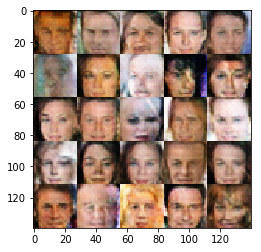

Epoch 1/1... Discriminator Loss: 1.4173... Generator Loss: 0.7179
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.7320
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.7308
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.7038
Epoch 1/1... Discriminator Loss: 1.4444... Generator Loss: 0.6787
Epoch 1/1... Discriminator Loss: 1.4345... Generator Loss: 0.7076
Epoch 1/1... Discriminator Loss: 1.4392... Generator Loss: 0.6936
Epoch 1/1... Discriminator Loss: 1.4477... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.7318
Epoch 1/1... Discriminator Loss: 1.4231... Generator Loss: 0.6924


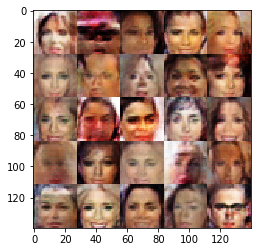

Epoch 1/1... Discriminator Loss: 1.4409... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.4053... Generator Loss: 0.7688
Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.7292
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.6960
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.4107... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.4185... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.4479... Generator Loss: 0.6931
Epoch 1/1... Discriminator Loss: 1.4393... Generator Loss: 0.7343
Epoch 1/1... Discriminator Loss: 1.4262... Generator Loss: 0.7136


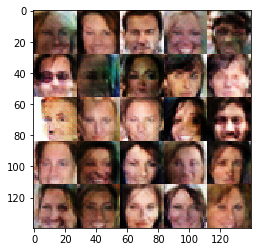

Epoch 1/1... Discriminator Loss: 1.4402... Generator Loss: 0.7048
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.4374... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 1.4097... Generator Loss: 0.7254
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.4094... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.4712... Generator Loss: 0.6407
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.6791
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.7279


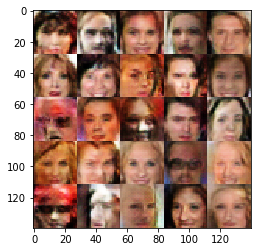

Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.4057... Generator Loss: 0.7359
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 0.7517
Epoch 1/1... Discriminator Loss: 1.3653... Generator Loss: 0.7523
Epoch 1/1... Discriminator Loss: 1.4243... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.4544... Generator Loss: 0.6947
Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.6792
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.7543
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.6666
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6991


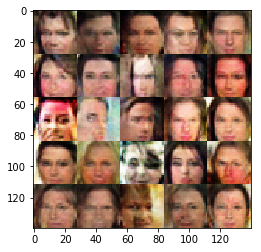

Epoch 1/1... Discriminator Loss: 1.4695... Generator Loss: 0.6778
Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 0.7403
Epoch 1/1... Discriminator Loss: 1.4542... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4446... Generator Loss: 0.7026
Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.7293
Epoch 1/1... Discriminator Loss: 1.4187... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.3963... Generator Loss: 0.7407
Epoch 1/1... Discriminator Loss: 1.3917... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.3985... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.6896


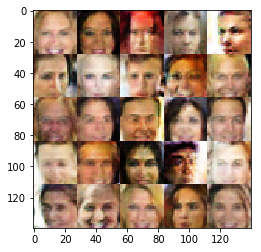

Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.7020
Epoch 1/1... Discriminator Loss: 1.4003... Generator Loss: 0.7640
Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.7230
Epoch 1/1... Discriminator Loss: 1.4535... Generator Loss: 0.6964
Epoch 1/1... Discriminator Loss: 1.4417... Generator Loss: 0.7042
Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.6847
Epoch 1/1... Discriminator Loss: 1.4452... Generator Loss: 0.7007
Epoch 1/1... Discriminator Loss: 1.4349... Generator Loss: 0.6987
Epoch 1/1... Discriminator Loss: 1.4041... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 0.7065


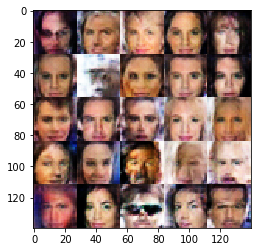

Epoch 1/1... Discriminator Loss: 1.4196... Generator Loss: 0.7165
Epoch 1/1... Discriminator Loss: 1.4727... Generator Loss: 0.7018
Epoch 1/1... Discriminator Loss: 1.4258... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 1.3993... Generator Loss: 0.7346
Epoch 1/1... Discriminator Loss: 1.4112... Generator Loss: 0.7249
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.4337... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.4638... Generator Loss: 0.6530
Epoch 1/1... Discriminator Loss: 1.4213... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.5038... Generator Loss: 0.6173


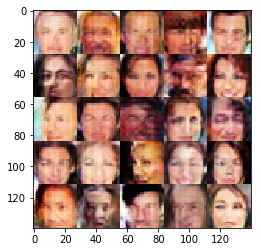

Epoch 1/1... Discriminator Loss: 1.4318... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.7098
Epoch 1/1... Discriminator Loss: 1.4565... Generator Loss: 0.7079
Epoch 1/1... Discriminator Loss: 1.4322... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.4690... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 1.4823... Generator Loss: 0.6682
Epoch 1/1... Discriminator Loss: 1.4623... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.4692... Generator Loss: 0.6931


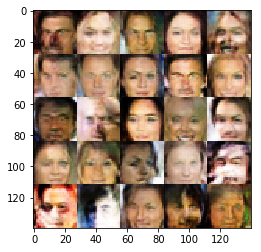

Epoch 1/1... Discriminator Loss: 1.4426... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.4155... Generator Loss: 0.7074
Epoch 1/1... Discriminator Loss: 1.4063... Generator Loss: 0.7387
Epoch 1/1... Discriminator Loss: 1.4717... Generator Loss: 0.6761
Epoch 1/1... Discriminator Loss: 1.4326... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.4325... Generator Loss: 0.6979
Epoch 1/1... Discriminator Loss: 1.4115... Generator Loss: 0.7002
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.7201
Epoch 1/1... Discriminator Loss: 1.4378... Generator Loss: 0.6610


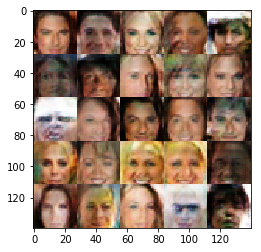

Epoch 1/1... Discriminator Loss: 1.4316... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.7444
Epoch 1/1... Discriminator Loss: 1.4595... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.4377... Generator Loss: 0.6999
Epoch 1/1... Discriminator Loss: 1.4389... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.4819... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 1.4211... Generator Loss: 0.7199


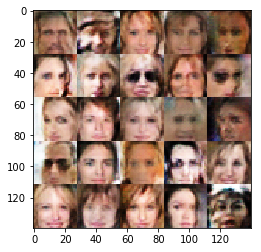

Epoch 1/1... Discriminator Loss: 1.4357... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.4267... Generator Loss: 0.7206
Epoch 1/1... Discriminator Loss: 1.4450... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.4481... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.4775... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.4889... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.4505... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.3713... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.7072
Epoch 1/1... Discriminator Loss: 1.4625... Generator Loss: 0.6724


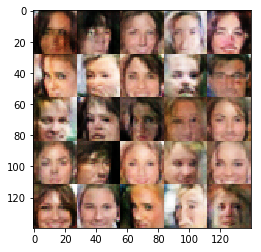

Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.4842... Generator Loss: 0.6690
Epoch 1/1... Discriminator Loss: 1.4517... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.4603... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.4782... Generator Loss: 0.6694
Epoch 1/1... Discriminator Loss: 1.4225... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.4747... Generator Loss: 0.6912
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.6930
Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.4592... Generator Loss: 0.7123


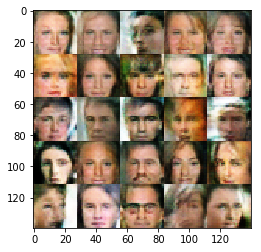

Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.7059
Epoch 1/1... Discriminator Loss: 1.4297... Generator Loss: 0.7011
Epoch 1/1... Discriminator Loss: 1.4312... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.4311... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.4458... Generator Loss: 0.6876
Epoch 1/1... Discriminator Loss: 1.4288... Generator Loss: 0.7088
Epoch 1/1... Discriminator Loss: 1.4147... Generator Loss: 0.7227
Epoch 1/1... Discriminator Loss: 1.4450... Generator Loss: 0.6973
Epoch 1/1... Discriminator Loss: 1.4380... Generator Loss: 0.7177
Epoch 1/1... Discriminator Loss: 1.4724... Generator Loss: 0.6596


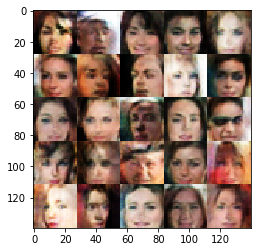

Epoch 1/1... Discriminator Loss: 1.5335... Generator Loss: 0.6128
Epoch 1/1... Discriminator Loss: 1.4394... Generator Loss: 0.6615
Epoch 1/1... Discriminator Loss: 1.4559... Generator Loss: 0.6832
Epoch 1/1... Discriminator Loss: 1.3941... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 1.3874... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.4137... Generator Loss: 0.7394
Epoch 1/1... Discriminator Loss: 1.3676... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.4755... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.4646... Generator Loss: 0.6715


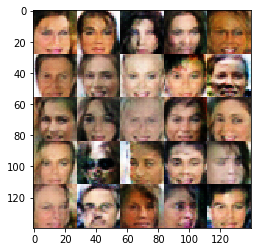

Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.6929
Epoch 1/1... Discriminator Loss: 1.4218... Generator Loss: 0.7221
Epoch 1/1... Discriminator Loss: 1.4447... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.4717... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.4125... Generator Loss: 0.6858
Epoch 1/1... Discriminator Loss: 1.4963... Generator Loss: 0.6754
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.4456... Generator Loss: 0.7400
Epoch 1/1... Discriminator Loss: 1.4324... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.6853


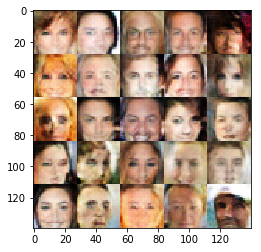

Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.6790
Epoch 1/1... Discriminator Loss: 1.4590... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.4655... Generator Loss: 0.6921
Epoch 1/1... Discriminator Loss: 1.4903... Generator Loss: 0.6336
Epoch 1/1... Discriminator Loss: 1.5192... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.6637
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.3962... Generator Loss: 0.7238
Epoch 1/1... Discriminator Loss: 1.4661... Generator Loss: 0.6866
Epoch 1/1... Discriminator Loss: 1.4044... Generator Loss: 0.7292


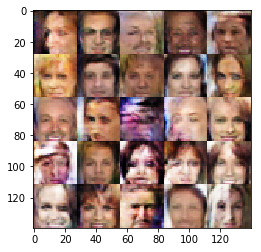

Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 0.6718
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.6288
Epoch 1/1... Discriminator Loss: 1.4256... Generator Loss: 0.7013
Epoch 1/1... Discriminator Loss: 1.4538... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6907
Epoch 1/1... Discriminator Loss: 1.4484... Generator Loss: 0.6606
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 1.4475... Generator Loss: 0.6659


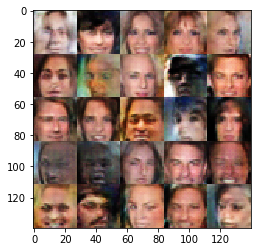

Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.6598
Epoch 1/1... Discriminator Loss: 1.4435... Generator Loss: 0.6817
Epoch 1/1... Discriminator Loss: 1.4404... Generator Loss: 0.7016
Epoch 1/1... Discriminator Loss: 1.4766... Generator Loss: 0.6838
Epoch 1/1... Discriminator Loss: 1.4606... Generator Loss: 0.6446
Epoch 1/1... Discriminator Loss: 1.4725... Generator Loss: 0.6766
Epoch 1/1... Discriminator Loss: 1.4987... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.4373... Generator Loss: 0.6751
Epoch 1/1... Discriminator Loss: 1.4765... Generator Loss: 0.6859
Epoch 1/1... Discriminator Loss: 1.4301... Generator Loss: 0.7090


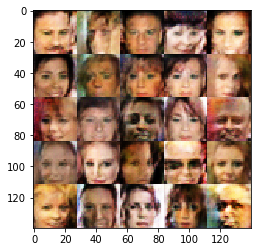

Epoch 1/1... Discriminator Loss: 1.4013... Generator Loss: 0.6780
Epoch 1/1... Discriminator Loss: 1.4315... Generator Loss: 0.6881
Epoch 1/1... Discriminator Loss: 1.4738... Generator Loss: 0.6697
Epoch 1/1... Discriminator Loss: 1.4448... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.4443... Generator Loss: 0.7097
Epoch 1/1... Discriminator Loss: 1.4607... Generator Loss: 0.6901
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.7236
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.6765
Epoch 1/1... Discriminator Loss: 1.4381... Generator Loss: 0.7040
Epoch 1/1... Discriminator Loss: 1.4440... Generator Loss: 0.7042


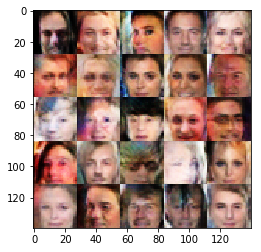

Epoch 1/1... Discriminator Loss: 1.4715... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.4400... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.6730
Epoch 1/1... Discriminator Loss: 1.4169... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.4473... Generator Loss: 0.6980
Epoch 1/1... Discriminator Loss: 1.4707... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.4833... Generator Loss: 0.6704
Epoch 1/1... Discriminator Loss: 1.4303... Generator Loss: 0.6785
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.6771
Epoch 1/1... Discriminator Loss: 1.4507... Generator Loss: 0.6905


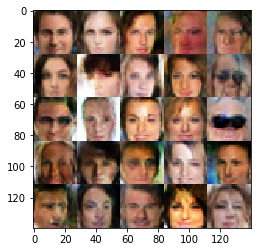

Epoch 1/1... Discriminator Loss: 1.4760... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.4118... Generator Loss: 0.7028
Epoch 1/1... Discriminator Loss: 1.4454... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 1.4718... Generator Loss: 0.6608
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.6721
Epoch 1/1... Discriminator Loss: 1.4582... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7053
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 0.6623
Epoch 1/1... Discriminator Loss: 1.4943... Generator Loss: 0.6331
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.6515


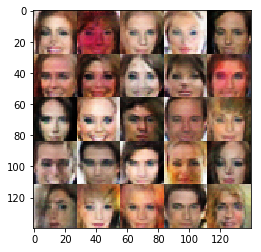

Epoch 1/1... Discriminator Loss: 1.4438... Generator Loss: 0.6365
Epoch 1/1... Discriminator Loss: 1.5202... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 1.4733... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.4964... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.4028... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.4742... Generator Loss: 0.6359
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.6628
Epoch 1/1... Discriminator Loss: 1.4251... Generator Loss: 0.7092
Epoch 1/1... Discriminator Loss: 1.4649... Generator Loss: 0.6765
Epoch 1/1... Discriminator Loss: 1.4265... Generator Loss: 0.6934


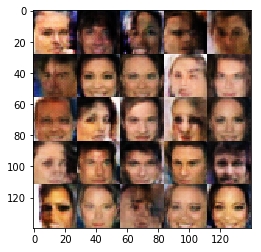

Epoch 1/1... Discriminator Loss: 1.3801... Generator Loss: 0.6873
Epoch 1/1... Discriminator Loss: 1.4010... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.4892... Generator Loss: 0.6837
Epoch 1/1... Discriminator Loss: 1.4333... Generator Loss: 0.6970
Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.6982
Epoch 1/1... Discriminator Loss: 1.5334... Generator Loss: 0.6373
Epoch 1/1... Discriminator Loss: 1.4419... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.4591... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.4144... Generator Loss: 0.7025


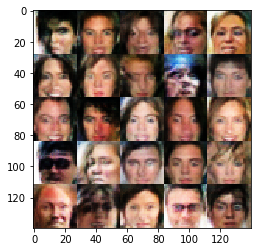

Epoch 1/1... Discriminator Loss: 1.4629... Generator Loss: 0.6861
Epoch 1/1... Discriminator Loss: 1.4685... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 1.4741... Generator Loss: 0.6532
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6549
Epoch 1/1... Discriminator Loss: 1.4839... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.7112
Epoch 1/1... Discriminator Loss: 1.5040... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.4807... Generator Loss: 0.6629
Epoch 1/1... Discriminator Loss: 1.4674... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.4508... Generator Loss: 0.6295


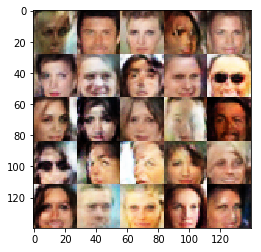

Epoch 1/1... Discriminator Loss: 1.4545... Generator Loss: 0.6634
Epoch 1/1... Discriminator Loss: 1.4425... Generator Loss: 0.6840
Epoch 1/1... Discriminator Loss: 1.4470... Generator Loss: 0.6891
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.6965
Epoch 1/1... Discriminator Loss: 1.4772... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.6555
Epoch 1/1... Discriminator Loss: 1.4967... Generator Loss: 0.6586
Epoch 1/1... Discriminator Loss: 1.4145... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.4769... Generator Loss: 0.6559
Epoch 1/1... Discriminator Loss: 1.4678... Generator Loss: 0.6763


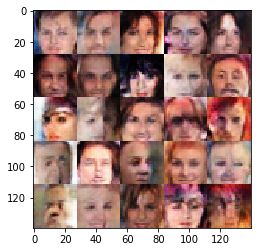

Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.4617... Generator Loss: 0.6555
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.4355... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 1.4819... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.4096... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.4726... Generator Loss: 0.6711
Epoch 1/1... Discriminator Loss: 1.4884... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.4827... Generator Loss: 0.6486
Epoch 1/1... Discriminator Loss: 1.4555... Generator Loss: 0.6557


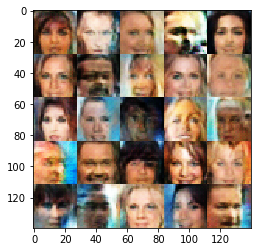

Epoch 1/1... Discriminator Loss: 1.3737... Generator Loss: 0.7278
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.4385... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.6650
Epoch 1/1... Discriminator Loss: 1.5051... Generator Loss: 0.6625
Epoch 1/1... Discriminator Loss: 1.4188... Generator Loss: 0.6971
Epoch 1/1... Discriminator Loss: 1.4615... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.4119... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.4541... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.4178... Generator Loss: 0.7008


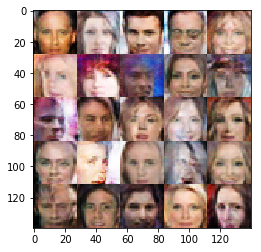

Epoch 1/1... Discriminator Loss: 1.5124... Generator Loss: 0.6574
Epoch 1/1... Discriminator Loss: 1.4801... Generator Loss: 0.6313
Epoch 1/1... Discriminator Loss: 1.4484... Generator Loss: 0.6884
Epoch 1/1... Discriminator Loss: 1.4525... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 1.4648... Generator Loss: 0.6388
Epoch 1/1... Discriminator Loss: 1.4470... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 1.5044... Generator Loss: 0.6618
Epoch 1/1... Discriminator Loss: 1.4596... Generator Loss: 0.6889
Epoch 1/1... Discriminator Loss: 1.4549... Generator Loss: 0.6977
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.6627


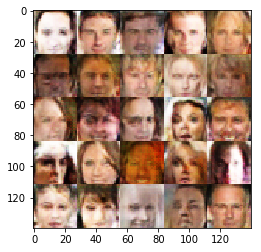

Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.4652... Generator Loss: 0.7126
Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.6749
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.6459
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.6700
Epoch 1/1... Discriminator Loss: 1.4202... Generator Loss: 0.7043
Epoch 1/1... Discriminator Loss: 1.4561... Generator Loss: 0.6553
Epoch 1/1... Discriminator Loss: 1.5207... Generator Loss: 0.6045
Epoch 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.6132
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.6534


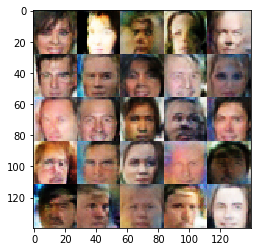

Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.7229
Epoch 1/1... Discriminator Loss: 1.4826... Generator Loss: 0.6810
Epoch 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.6391
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.6743
Epoch 1/1... Discriminator Loss: 1.3837... Generator Loss: 0.7218
Epoch 1/1... Discriminator Loss: 1.4871... Generator Loss: 0.6367
Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.6769
Epoch 1/1... Discriminator Loss: 1.4722... Generator Loss: 0.6923
Epoch 1/1... Discriminator Loss: 1.4815... Generator Loss: 0.6604
Epoch 1/1... Discriminator Loss: 1.4368... Generator Loss: 0.6627


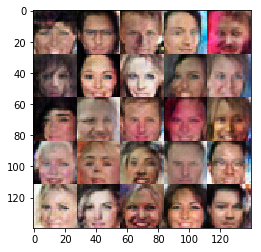

Epoch 1/1... Discriminator Loss: 1.4831... Generator Loss: 0.6096
Epoch 1/1... Discriminator Loss: 1.4339... Generator Loss: 0.6787
Epoch 1/1... Discriminator Loss: 1.4308... Generator Loss: 0.7059
Epoch 1/1... Discriminator Loss: 1.4966... Generator Loss: 0.6366
Epoch 1/1... Discriminator Loss: 1.4451... Generator Loss: 0.6671
Epoch 1/1... Discriminator Loss: 1.4488... Generator Loss: 0.6696
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.6519
Epoch 1/1... Discriminator Loss: 1.4496... Generator Loss: 0.6834
Epoch 1/1... Discriminator Loss: 1.4620... Generator Loss: 0.6491
Epoch 1/1... Discriminator Loss: 1.4577... Generator Loss: 0.6688


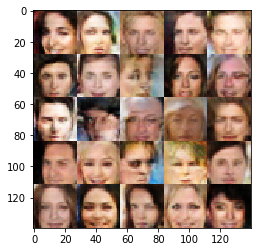

Epoch 1/1... Discriminator Loss: 1.4472... Generator Loss: 0.6801
Epoch 1/1... Discriminator Loss: 1.4512... Generator Loss: 0.6669
Epoch 1/1... Discriminator Loss: 1.5158... Generator Loss: 0.5960
Epoch 1/1... Discriminator Loss: 1.4285... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.4637... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.4923... Generator Loss: 0.6409
Epoch 1/1... Discriminator Loss: 1.4825... Generator Loss: 0.6785
Epoch 1/1... Discriminator Loss: 1.4402... Generator Loss: 0.6582
Epoch 1/1... Discriminator Loss: 1.4510... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.4215... Generator Loss: 0.6859


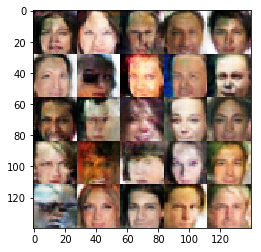

Epoch 1/1... Discriminator Loss: 1.4521... Generator Loss: 0.6399
Epoch 1/1... Discriminator Loss: 1.5181... Generator Loss: 0.5859
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.6754
Epoch 1/1... Discriminator Loss: 1.4287... Generator Loss: 0.6836
Epoch 1/1... Discriminator Loss: 1.4566... Generator Loss: 0.6595
Epoch 1/1... Discriminator Loss: 1.4739... Generator Loss: 0.7118
Epoch 1/1... Discriminator Loss: 1.4513... Generator Loss: 0.6500
Epoch 1/1... Discriminator Loss: 1.5551... Generator Loss: 0.6479
Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 0.7106
Epoch 1/1... Discriminator Loss: 1.4251... Generator Loss: 0.6720


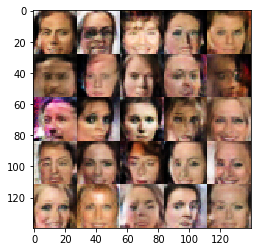

Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.6764
Epoch 1/1... Discriminator Loss: 1.4786... Generator Loss: 0.6258
Epoch 1/1... Discriminator Loss: 1.4690... Generator Loss: 0.6499
Epoch 1/1... Discriminator Loss: 1.5490... Generator Loss: 0.6011
Epoch 1/1... Discriminator Loss: 1.5178... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.6531
Epoch 1/1... Discriminator Loss: 1.3656... Generator Loss: 0.7569
Epoch 1/1... Discriminator Loss: 1.5195... Generator Loss: 0.5670
Epoch 1/1... Discriminator Loss: 1.5284... Generator Loss: 0.5830
Epoch 1/1... Discriminator Loss: 1.4578... Generator Loss: 0.6920


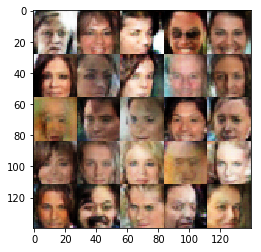

Epoch 1/1... Discriminator Loss: 1.5059... Generator Loss: 0.6073
Epoch 1/1... Discriminator Loss: 1.5344... Generator Loss: 0.6008
Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.6110
Epoch 1/1... Discriminator Loss: 1.5323... Generator Loss: 0.6434
Epoch 1/1... Discriminator Loss: 1.4697... Generator Loss: 0.6583
Epoch 1/1... Discriminator Loss: 1.4955... Generator Loss: 0.6280
Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.4685... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.4700... Generator Loss: 0.6329
Epoch 1/1... Discriminator Loss: 1.4928... Generator Loss: 0.6253


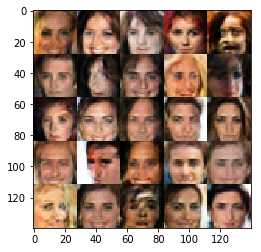

Epoch 1/1... Discriminator Loss: 1.3550... Generator Loss: 0.7339
Epoch 1/1... Discriminator Loss: 1.4781... Generator Loss: 0.6160
Epoch 1/1... Discriminator Loss: 1.4704... Generator Loss: 0.6863
Epoch 1/1... Discriminator Loss: 1.4745... Generator Loss: 0.6709
Epoch 1/1... Discriminator Loss: 1.4811... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.4709... Generator Loss: 0.6475
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.6972
Epoch 1/1... Discriminator Loss: 1.5007... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.4930... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.5104... Generator Loss: 0.6108


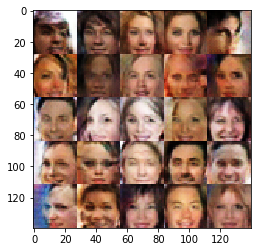

Epoch 1/1... Discriminator Loss: 1.4799... Generator Loss: 0.6314
Epoch 1/1... Discriminator Loss: 1.5506... Generator Loss: 0.5956
Epoch 1/1... Discriminator Loss: 1.4909... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 1.5610... Generator Loss: 0.6217
Epoch 1/1... Discriminator Loss: 1.5254... Generator Loss: 0.6117
Epoch 1/1... Discriminator Loss: 1.4501... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 1.4414... Generator Loss: 0.6662
Epoch 1/1... Discriminator Loss: 1.6038... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 1.4766... Generator Loss: 0.6689
Epoch 1/1... Discriminator Loss: 1.4529... Generator Loss: 0.6364


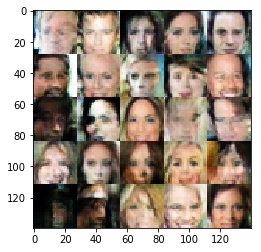

Epoch 1/1... Discriminator Loss: 1.5093... Generator Loss: 0.6216
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.7204
Epoch 1/1... Discriminator Loss: 1.4370... Generator Loss: 0.6956
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.6527
Epoch 1/1... Discriminator Loss: 1.4618... Generator Loss: 0.6745
Epoch 1/1... Discriminator Loss: 1.4822... Generator Loss: 0.6456
Epoch 1/1... Discriminator Loss: 1.4671... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.5252... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 1.5631... Generator Loss: 0.6214
Epoch 1/1... Discriminator Loss: 1.4616... Generator Loss: 0.6717


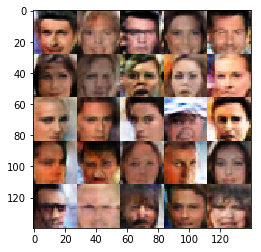

Epoch 1/1... Discriminator Loss: 1.4847... Generator Loss: 0.6160
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.6839
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.6783
Epoch 1/1... Discriminator Loss: 1.4631... Generator Loss: 0.6529
Epoch 1/1... Discriminator Loss: 1.5544... Generator Loss: 0.5987
Epoch 1/1... Discriminator Loss: 1.4428... Generator Loss: 0.7033
Epoch 1/1... Discriminator Loss: 1.4049... Generator Loss: 0.6853
Epoch 1/1... Discriminator Loss: 1.5315... Generator Loss: 0.6236
Epoch 1/1... Discriminator Loss: 1.4598... Generator Loss: 0.6646
Epoch 1/1... Discriminator Loss: 1.4704... Generator Loss: 0.6485


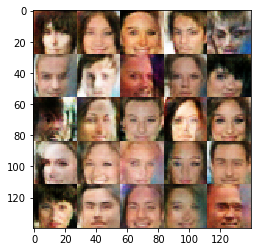

Epoch 1/1... Discriminator Loss: 1.4642... Generator Loss: 0.6633
Epoch 1/1... Discriminator Loss: 1.4121... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.5260... Generator Loss: 0.6213
Epoch 1/1... Discriminator Loss: 1.4061... Generator Loss: 0.7435
Epoch 1/1... Discriminator Loss: 1.4528... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.4852... Generator Loss: 0.6410
Epoch 1/1... Discriminator Loss: 1.5306... Generator Loss: 0.6159
Epoch 1/1... Discriminator Loss: 1.4967... Generator Loss: 0.6447
Epoch 1/1... Discriminator Loss: 1.5206... Generator Loss: 0.6137
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.6713


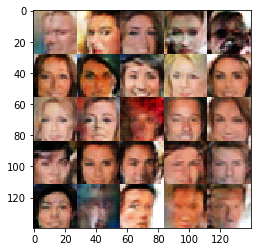

Epoch 1/1... Discriminator Loss: 1.4494... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 1.4621... Generator Loss: 0.6596
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.6808
Epoch 1/1... Discriminator Loss: 1.4457... Generator Loss: 0.6521
Epoch 1/1... Discriminator Loss: 1.5053... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.4295... Generator Loss: 0.6829
Epoch 1/1... Discriminator Loss: 1.4557... Generator Loss: 0.6481
Epoch 1/1... Discriminator Loss: 1.4872... Generator Loss: 0.6183
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.6900
Epoch 1/1... Discriminator Loss: 1.4639... Generator Loss: 0.6777


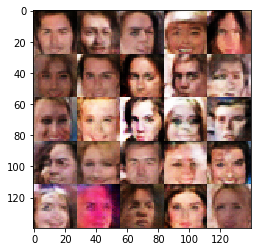

Epoch 1/1... Discriminator Loss: 1.4580... Generator Loss: 0.6165
Epoch 1/1... Discriminator Loss: 1.5121... Generator Loss: 0.6219
Epoch 1/1... Discriminator Loss: 1.4814... Generator Loss: 0.6542
Epoch 1/1... Discriminator Loss: 1.4331... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.5376... Generator Loss: 0.5803
Epoch 1/1... Discriminator Loss: 1.5222... Generator Loss: 0.5729
Epoch 1/1... Discriminator Loss: 1.5049... Generator Loss: 0.6456
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6661
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.6278
Epoch 1/1... Discriminator Loss: 1.5180... Generator Loss: 0.5865


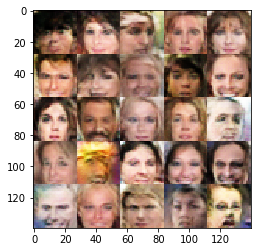

Epoch 1/1... Discriminator Loss: 1.4537... Generator Loss: 0.6461
Epoch 1/1... Discriminator Loss: 1.4302... Generator Loss: 0.6654
Epoch 1/1... Discriminator Loss: 1.3456... Generator Loss: 0.7213
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6465
Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.6431
Epoch 1/1... Discriminator Loss: 1.4961... Generator Loss: 0.6386
Epoch 1/1... Discriminator Loss: 1.4283... Generator Loss: 0.6924
Epoch 1/1... Discriminator Loss: 1.5306... Generator Loss: 0.5842
Epoch 1/1... Discriminator Loss: 1.4866... Generator Loss: 0.6170
Epoch 1/1... Discriminator Loss: 1.5451... Generator Loss: 0.6529


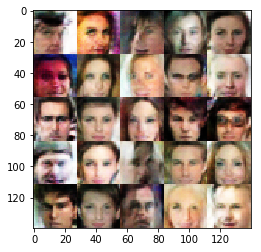

Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.4769... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.4870... Generator Loss: 0.6355
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.7069
Epoch 1/1... Discriminator Loss: 1.4606... Generator Loss: 0.6518
Epoch 1/1... Discriminator Loss: 1.5065... Generator Loss: 0.5949
Epoch 1/1... Discriminator Loss: 1.5164... Generator Loss: 0.6217
Epoch 1/1... Discriminator Loss: 1.3918... Generator Loss: 0.6694
Epoch 1/1... Discriminator Loss: 1.4334... Generator Loss: 0.6717
Epoch 1/1... Discriminator Loss: 1.4160... Generator Loss: 0.7365


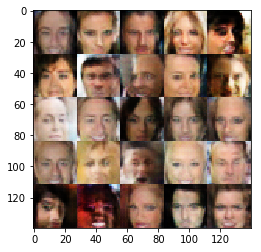

Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.6436
Epoch 1/1... Discriminator Loss: 1.4746... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.4184... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 1.4751... Generator Loss: 0.6368
Epoch 1/1... Discriminator Loss: 1.5512... Generator Loss: 0.6292
Epoch 1/1... Discriminator Loss: 1.4563... Generator Loss: 0.6263
Epoch 1/1... Discriminator Loss: 1.5178... Generator Loss: 0.5600
Epoch 1/1... Discriminator Loss: 1.4783... Generator Loss: 0.6271
Epoch 1/1... Discriminator Loss: 1.4745... Generator Loss: 0.6125
Epoch 1/1... Discriminator Loss: 1.4754... Generator Loss: 0.6626


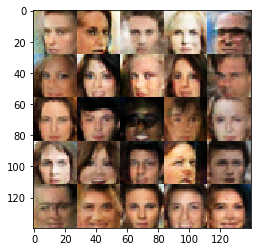

Epoch 1/1... Discriminator Loss: 1.3979... Generator Loss: 0.6544
Epoch 1/1... Discriminator Loss: 1.4421... Generator Loss: 0.6609
Epoch 1/1... Discriminator Loss: 1.3818... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.4752... Generator Loss: 0.6403
Epoch 1/1... Discriminator Loss: 1.4108... Generator Loss: 0.6687
Epoch 1/1... Discriminator Loss: 1.4711... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.6460
Epoch 1/1... Discriminator Loss: 1.4264... Generator Loss: 0.6337
Epoch 1/1... Discriminator Loss: 1.4955... Generator Loss: 0.6031
Epoch 1/1... Discriminator Loss: 1.5641... Generator Loss: 0.5754


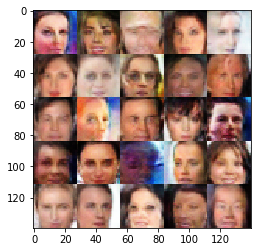

Epoch 1/1... Discriminator Loss: 1.4359... Generator Loss: 0.6868
Epoch 1/1... Discriminator Loss: 1.5097... Generator Loss: 0.6344
Epoch 1/1... Discriminator Loss: 1.5168... Generator Loss: 0.5824
Epoch 1/1... Discriminator Loss: 1.4933... Generator Loss: 0.6082
Epoch 1/1... Discriminator Loss: 1.4621... Generator Loss: 0.6229
Epoch 1/1... Discriminator Loss: 1.4819... Generator Loss: 0.6011
Epoch 1/1... Discriminator Loss: 1.4916... Generator Loss: 0.6163
Epoch 1/1... Discriminator Loss: 1.5945... Generator Loss: 0.5556
Epoch 1/1... Discriminator Loss: 1.4504... Generator Loss: 0.6338
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 0.6837


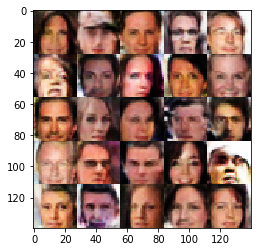

Epoch 1/1... Discriminator Loss: 1.4842... Generator Loss: 0.6375
Epoch 1/1... Discriminator Loss: 1.5701... Generator Loss: 0.5629
Epoch 1/1... Discriminator Loss: 1.4039... Generator Loss: 0.6862
Epoch 1/1... Discriminator Loss: 1.5134... Generator Loss: 0.6127
Epoch 1/1... Discriminator Loss: 1.4920... Generator Loss: 0.6503
Epoch 1/1... Discriminator Loss: 1.4757... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.4556... Generator Loss: 0.6384
Epoch 1/1... Discriminator Loss: 1.4719... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.4864... Generator Loss: 0.6246
Epoch 1/1... Discriminator Loss: 1.4737... Generator Loss: 0.6387


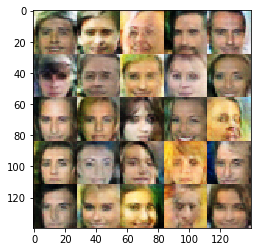

Epoch 1/1... Discriminator Loss: 1.4652... Generator Loss: 0.6563
Epoch 1/1... Discriminator Loss: 1.3973... Generator Loss: 0.6496
Epoch 1/1... Discriminator Loss: 1.5615... Generator Loss: 0.5876
Epoch 1/1... Discriminator Loss: 1.4347... Generator Loss: 0.6436
Epoch 1/1... Discriminator Loss: 1.4168... Generator Loss: 0.6425
Epoch 1/1... Discriminator Loss: 1.4999... Generator Loss: 0.6220


In [49]:
batch_size = 16
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.